<a href="https://colab.research.google.com/github/Samcoodess/Breast_Cancer-Detection/blob/main/Breast_Cancer_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Breast cancer Detection model by SAM**







**Install necessary Libraries**

In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip (22.0 MB)


In [ ]:
!pip install opendatasets 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install pandas-profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


**Import Libraries**

In [ ]:
import opendatasets as od
import warnings
import sysconfig

import pandas as pd
import numpy as np
import scipy as sp
import psutil,os
from pandas_profiling import ProfileReport



In [ ]:
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn import model_selection
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


In [ ]:
%matplotlib inline

In [ ]:
!pip install matplotlib-venn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import seaborn as sns


In [ ]:
from pandas.plotting import scatter_matrix

# **Data**
Now that we have imported all the necessary Libraries, let's get to the work of data. 

We got this! 
         -Sam

In [ ]:
data='/content/drive/MyDrive/Github Projects/Breast Cancer Detection/breast-cancer-wisconsin.data'


In [ ]:
names = ["id","clump_thickness","uniform_cell-size","uniform_cell_shape","marginal_adhesion", "single_epithelial_size", "bare_nuclei", "bland_chromaton", "normal_nucleoli","nutises",	"class"]
# 
df= pd.read_csv(data,names=names)

In [ ]:
df.head(5)

,id,clump_thickness,uniform_cell-size,uniform_cell_shape,marginal_adhesion,single_epithelial_size,bare_nuclei,bland_chromaton,normal_nucleoli,nutises,class
0,1000025,5,1,1,1,2,1,3,1,1,2
1,1002945,5,4,4,5,7,10,3,2,1,2
2,1015425,3,1,1,1,2,2,3,1,1,2
3,1016277,6,8,8,1,3,4,3,7,1,2
4,1017023,4,1,1,3,2,1,3,1,1,2


In [ ]:
df.describe

<bound method NDFrame.describe of           id  clump_thickness  uniform_cell-size  uniform_cell_shape  \
0    1000025                5                  1                   1   
1    1002945                5                  4                   4   
2    1015425                3                  1                   1   
3    1016277                6                  8                   8   
4    1017023                4                  1                   1   
..       ...              ...                ...                 ...   
694   776715                3                  1                   1   
695   841769                2                  1                   1   
696   888820                5                 10                  10   
697   897471                4                  8                   6   
698   897471                4                  8                   8   

     marginal_adhesion  single_epithelial_size bare_nuclei  bland_chromaton  \
0                    1

In [ ]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport

In [ ]:
profile = ProfileReport(df, title ="Breast Cancer")

In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# **What to do with Mising data?**
From the report we see that there are several missing data. Let's tackle with them 💪

In [ ]:
df.columns

Index(['id', 'clump_thickness', 'uniform_cell-size', 'uniform_cell_shape',
       'marginal_adhesion', 'single_epithelial_size', 'bare_nuclei',
       'bland_chromaton', 'normal_nucleoli', 'nutises', 'class'],
      dtype='object')

In [ ]:
# preprocess the data
df.replace("?",-999999, inplace = True)
print(df.axes)
df.drop(['id'],1, inplace = True)

# print the shape of the dataset
print(df.shape)

[RangeIndex(start=0, stop=699, step=1), Index(['id', 'clump_thickness', 'uniform_cell-size', 'uniform_cell_shape',
       'marginal_adhesion', 'single_epithelial_size', 'bare_nuclei',
       'bland_chromaton', 'normal_nucleoli', 'nutises', 'class'],
      dtype='object')]
(699, 10)


<ipython-input-44-fc1fc69563f8>:4: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  df.drop(['id'],1, inplace = True)


# **Data Visualization**
We see that there are 699 cells in the dataset.




In [ ]:
df.loc[6]
#loc is used for accessing multiple columns

clump_thickness            1
uniform_cell-size          1
uniform_cell_shape         1
marginal_adhesion          1
single_epithelial_size     2
bare_nuclei               10
bland_chromaton            3
normal_nucleoli            1
nutises                    1
class                      2
Name: 6, dtype: object

In [ ]:
df.describe

<bound method NDFrame.describe of      clump_thickness  uniform_cell-size  uniform_cell_shape  \
0                  5                  1                   1   
1                  5                  4                   4   
2                  3                  1                   1   
3                  6                  8                   8   
4                  4                  1                   1   
..               ...                ...                 ...   
694                3                  1                   1   
695                2                  1                   1   
696                5                 10                  10   
697                4                  8                   6   
698                4                  8                   8   

     marginal_adhesion  single_epithelial_size bare_nuclei  bland_chromaton  \
0                    1                       2           1                3   
1                    5                       7     

<function matplotlib.pyplot.show(*args, **kw)>

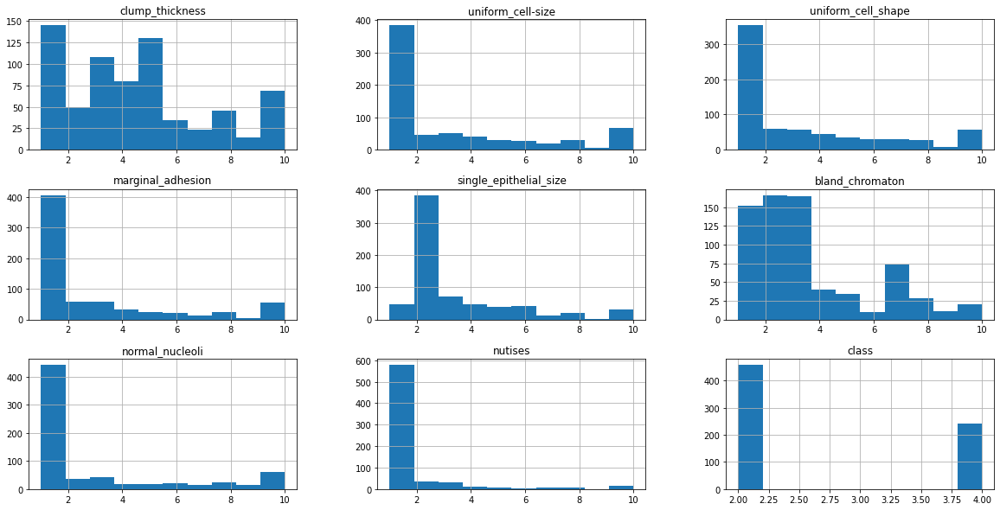

In [ ]:
df.hist(figsize = (20,10))
plt.show

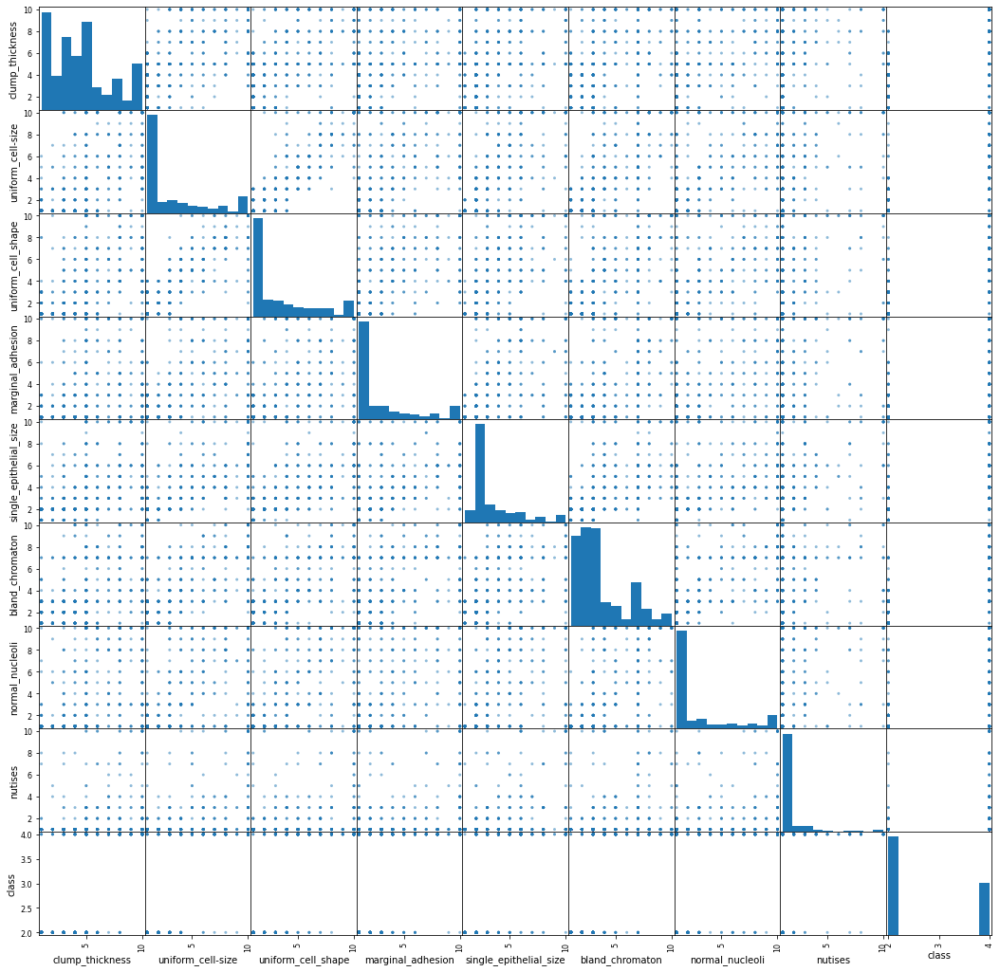

In [ ]:
scatter_matrix(df, figsize=(18,18))
plt.show()

first wedividexand y then split

In [ ]:

# Create X and Y datasets for training
X = np.array(df.drop(["class"],1))
y = np.array(df["class"])

X_train, X_test, y_train, y_test = model_selection.train_test_split(X,y, test_size=0.2)

<ipython-input-55-f8ab59ec8043>:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  X = np.array(df.drop(["class"],1))


In [ ]:
x=X

In [ ]:
x.shape

(699, 9)

In [ ]:
y.shape

(699,)

In [ ]:
models = []
models.append(("KNN", KNeighborsClassifier(n_neighbors = 5)))
models.append(("SVC",SVC()))

# evaluate each model in turn
results = []
names = []

for name, model in models:
    kfold = model_selection.KFold(n_splits=10, random_state = 8, shuffle = True)
    cv_results = model_selection.cross_val_score(model, X_train, y_train, cv= kfold, scoring="accuracy")
    results.append(cv_results)
    names.append(name)
    
    msg = "{}: mean :{:.3f}  standard deviation:{:.3f}".format(str(name),cv_results.mean(), cv_results.std())
    print(msg)

KNN: mean :0.973  standard deviation:0.023
SVC: mean :0.662  standard deviation:0.053


In [ ]:
# Make predictions on validation dataset
for name,model in models:
    model.fit(X_train,y_train)
    predictions = model.predict(X_test)
    print("{}: {:.3f}".format(name, accuracy_score(y_test,predictions)))
    print(classification_report(y_test, predictions))

KNN: 0.971
              precision    recall  f1-score   support

           2       1.00      0.95      0.98        88
           4       0.93      1.00      0.96        52

    accuracy                           0.97       140
   macro avg       0.96      0.98      0.97       140
weighted avg       0.97      0.97      0.97       140

SVC: 0.629
              precision    recall  f1-score   support

           2       0.63      1.00      0.77        88
           4       0.00      0.00      0.00        52

    accuracy                           0.63       140
   macro avg       0.31      0.50      0.39       140
weighted avg       0.40      0.63      0.49       140



/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
clf = KNeighborsClassifier()

clf.fit(X_train, y_train)
print("Accuracy: {:.3f}".format(clf.score(X_test, y_test)))

example_measures = np.array([[4,2,1,1,1,2,3,2,1]])
example_measures = example_measures.reshape(len(example_measures), -1)
prediction = clf.predict(example_measures)
print(prediction)

Accuracy: 0.971
[2]
